<a href="https://colab.research.google.com/github/juacastanori/PDI/blob/main/Proyecto/PDI_Proyecto.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

#Proyecto: PDI
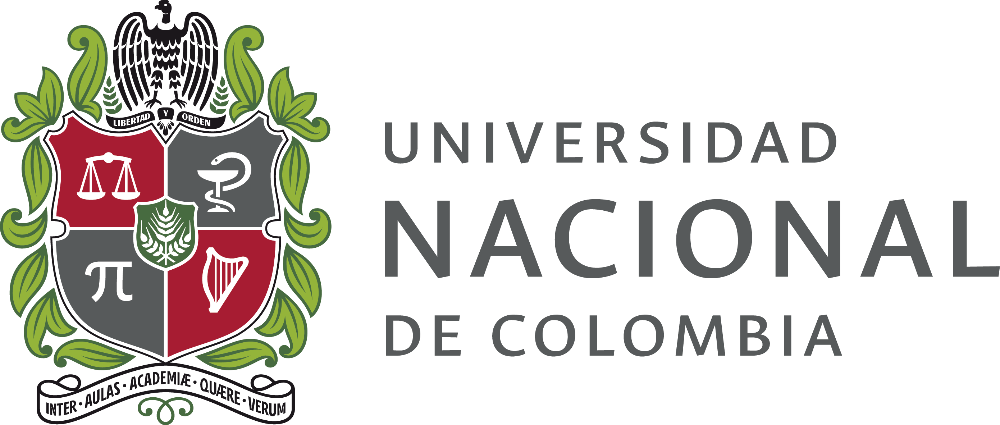
### **Universidad Nacional de Colombia sede Manizales**
#### Facultad de ingeniería y arquitectura
#### Departamento de ingeniería eléctrica, electrónica y computación
#### *Procesamiento digital de imágenes*

#### Profesor: Lucas Iturriago

# Hecho por:
## Juan Jerónimo Castaño Rivera
##Campos Herney Tulcan Cuasapud

Instalar librerias (roboflow para descargar el dataset y ultralytics para los modelos YOLO)

In [1]:
!pip install ultralytics roboflow

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.1/1.1 MB 20.1 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 89.9/89.9 kB 5.3 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 66.8/66.8 kB 2.6 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 49.9/49.9 MB 12.4 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.4/1.4 MB 24.3 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 4.2/4.2 MB 35.7 MB/s eta 0:00:00
  Attempting uninstall: opencv-python-headless
    Found existing installation: opencv-python-headless 4.12.0.88
    Uninstalling opencv-python-headless-4.12.0.88:
      Successfully uninstalled opencv-python-headless-4.12.0.88
  Attempting uninstall: idna
    Found existing installation: idna 3.11
    Uninstalling idna-3.11:
      Successfully uninstalled idna-3.11


Importar todas las librerias necesarias

In [2]:
# Importación de bibliotecas necesarias
import os
import random
import math
import time
import matplotlib.pyplot as plt
import matplotlib.image as mpimg
import yaml
import gdown
import wandb
import shutil
import requests
import ipywidgets as widgets
import cv2
import numpy as np
from pathlib import Path
from ultralytics import YOLO
from roboflow import Roboflow
from IPython.display import display, Image, clear_output
import matplotlib.pyplot as plt
import matplotlib.image as mpimg
import torch
import torchvision
import torch.nn as nn
from torchvision.io import ImageReadMode
import torchvision.transforms.functional as TF
from sklearn.metrics import classification_report, confusion_matrix, ConfusionMatrixDisplay, accuracy_score


# Deshabilitar Weights & Biases para evitar registros innecesarios
os.environ['WANDB_DISABLED'] = 'true'

Creating new Ultralytics Settings v0.0.6 file ✅ 
View Ultralytics Settings with 'yolo settings' or at '/root/.config/Ultralytics/settings.json'
Update Settings with 'yolo settings key=value', i.e. 'yolo settings runs_dir=path/to/dir'. For help see https://docs.ultralytics.com/quickstart/#ultralytics-settings.


Descargar el dataset

Link del dataset: https://app.roboflow.com/procesamientoimagenes/green_machinev2-nxegl-fzy6k/1

El dataset contiene 10 clases de plantas medicinales y 1 clase destinada a las plantas no medicinales

In [3]:
# Descarga del conjunto de datos desde Roboflow
rf = Roboflow(api_key="TBQT6PfDPRkkllrKI7UU")  # Clave de API para autenticación
project = rf.workspace("procesamientoimagenes").project("green_machinev2-nxegl-fzy6k")  # Proyecto en Roboflow
version = project.version(1)  # Versión específica del conjunto de datos
dataset = version.download("folder")  # Descarga en formato compatible con YOLOv8
dataset_dir = dataset.location

loading Roboflow workspace...
loading Roboflow project...



Extracting Dataset Version Zip to Green_MachineV2-1 in folder:: 100%|██████████| 3289/3289 [00:01<00:00, 1738.30it/s]


In [4]:
!find {dataset_dir} -maxdepth 2 -type d

/content/Green_MachineV2-1
/content/Green_MachineV2-1/test
/content/Green_MachineV2-1/test/Erythroxylum coca (coca)
/content/Green_MachineV2-1/test/Eryngium foetidum (CimarrÃ³n)
/content/Green_MachineV2-1/test/PlantasNoMedicinales
/content/Green_MachineV2-1/test/Calendula officinalis (Calendula)
/content/Green_MachineV2-1/test/Valeriana officinalis (Valeriana)
/content/Green_MachineV2-1/test/Ruta graveolens (Ruda)
/content/Green_MachineV2-1/test/Chamaemelum nobile (Manzanilla)
/content/Green_MachineV2-1/test/Dysphania ambrosioides (Paico)
/content/Green_MachineV2-1/test/Alo evera (SÃ¡bila)
/content/Green_MachineV2-1/test/Mentha spicata (Hierbabuena)
/content/Green_MachineV2-1/test/Peumus boldus (Boldo)
/content/Green_MachineV2-1/train
/content/Green_MachineV2-1/train/Erythroxylum coca (coca)
/content/Green_MachineV2-1/train/Eryngium foetidum (CimarrÃ³n)
/content/Green_MachineV2-1/train/PlantasNoMedicinales
/content/Green_MachineV2-1/train/Calendula officinalis (Calendula)
/content/Gree

El dataset contiene 10 clases de plantas medicinales y 1 clase destinada a las plantas no medicinales:

- Aloe vera (Sábila)
- Calendula officinalis (Caléndula)
- Chamaemelum nobile (Manzanilla)
- Dysphania ambrosioides (Paico)
- Eryngium foetidum (Cimarrón)
- Erythroxylum coca (coca)
- Mentha spicata (Hierbabuena)
- Peumus boldus (Boldo)
- Ruta graveolens (Ruda)
- Valeriana officinalis (Valeriana)
- Plantas no medicinales


Se hizo la partición en train, test, y validación en roboflow:

Distribución del dataset (Total 3251 imágenes)
Train: 87% → 2838 imágenes
Valid: 9% → 279 imágenes
Test: 4% → 134 imágenes


El archivo data.yaml se crea en el contexto de este código para configurar y definir la estructura del conjunto de datos para el entrenamiento del modelo de clasificación de imágenes YOLOv8-cls (Ultralytics).

In [5]:
cfg = {
    'train': 'train',
    'val':   'valid',
    'test':  'test',
    'names': [
        'Alo evera (SÃ¡bila)',
        'Calendula officinalis (Calendula)',
        'Chamaemelum nobile (Manzanilla)',
        'Dysphania ambrosioides (Paico)',
        'Eryngium foetidum (CimarrÃ³n)',
        'Erythroxylum coca (coca)',
        'Mentha spicata (Hierbabuena)',
        'Peumus boldus (Boldo)',
        'PlantasNoMedicinales',
        'Ruta graveolens (Ruda)',
        'Valeriana officinalis (Valeriana)'
    ]
}

yaml_path = os.path.join(dataset_dir, 'data.yaml')
with open(yaml_path, 'w') as f:
    yaml.safe_dump(cfg, f, sort_keys=False)

print("data.yaml creado en:", yaml_path)

data.yaml creado en: /content/Green_MachineV2-1/data.yaml


Se parte de un modelo de clasificación de YOLO (YOLOv8-cls). Este modelo sirve para nuestra tarea para tener una base. Aunque el modelo YOLOv8 no fue entrenado inicialmente para hacer inferencia en plantas, su base de datos (ImageNet) hace que sea robusto para cualquier tipo de tarea.

Se hace entrenamiento con early stopping, para 50 epocas, con batch de 32

In [6]:
model = YOLO('yolov8s-cls.pt')
results = model.train(
    task='classify',
    data=dataset_dir,
    epochs=50,
    imgsz=640,
    batch=32,
    device=0,
    patience=10,
    plots=True
)

Ultralytics 8.3.235 🚀 Python-3.12.12 torch-2.9.0+cu126 CUDA:0 (Tesla T4, 15095MiB)
engine/trainer: agnostic_nms=False, amp=True, augment=False, auto_augment=randaugment, batch=32, bgr=0.0, box=7.5, cache=False, cfg=None, classes=None, close_mosaic=10, cls=0.5, compile=False, conf=None, copy_paste=0.0, copy_paste_mode=flip, cos_lr=False, cutmix=0.0, data=/content/Green_MachineV2-1, degrees=0.0, deterministic=True, device=0, dfl=1.5, dnn=False, dropout=0.0, dynamic=False, embed=None, epochs=50, erasing=0.4, exist_ok=False, fliplr=0.5, flipud=0.0, format=torchscript, fraction=1.0, freeze=None, half=False, hsv_h=0.015, hsv_s=0.7, hsv_v=0.4, imgsz=640, int8=False, iou=0.7, keras=False, kobj=1.0, line_width=None, lr0=0.01, lrf=0.01, mask_ratio=4, max_det=300, mixup=0.0, mode=train, model=yolov8s-cls.pt, momentum=0.937, mosaic=1.0, multi_scale=False, name=train, nbs=64, nms=False, opset=None, optimize=False, optimizer=auto, overlap_mask=True, patience=10, perspective=0.0, plots=True, pose=12.

Se muestran las metricas de rendimiento

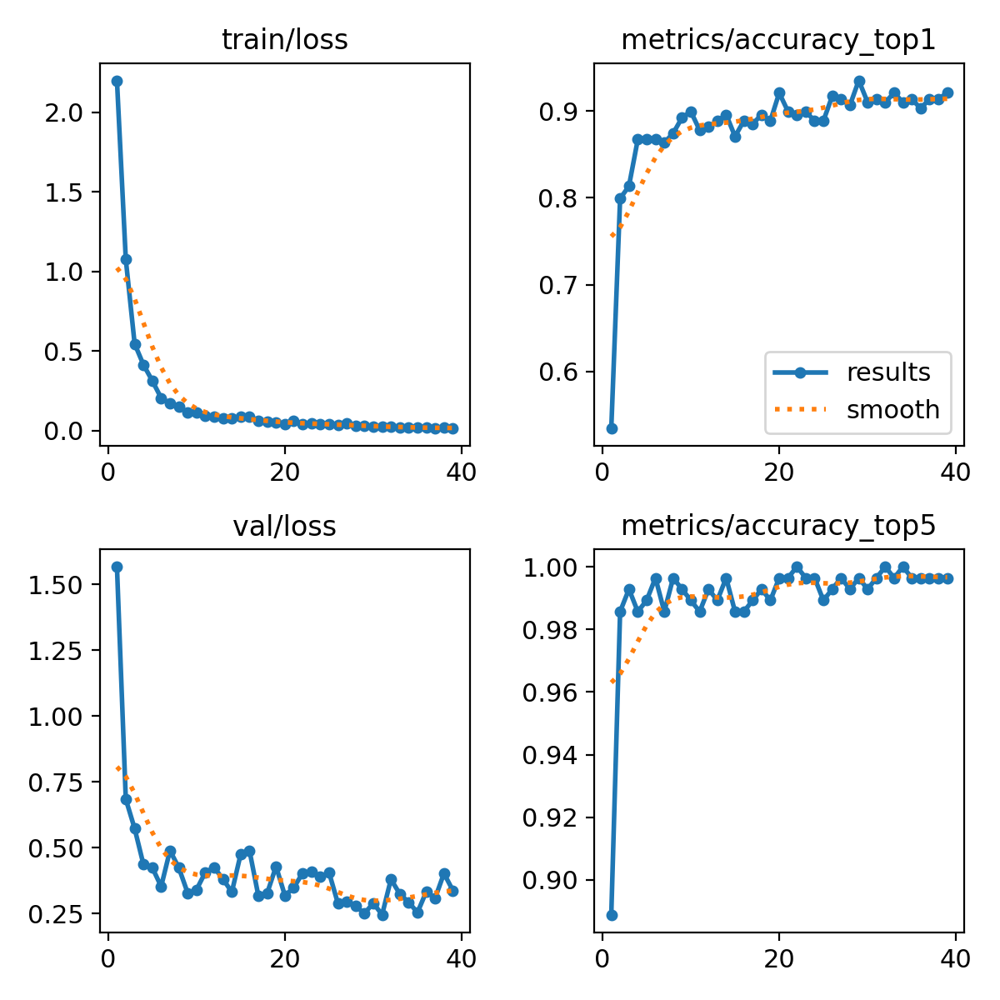

In [7]:
exp_dir = "runs/classify/train"   # Carpeta entrenamiento
# Gráfico de resultados
display(Image(filename=f"{exp_dir}/results.png"))

Se realiza la matriz de confusion para ver el desempeño del modelo (lo ideal es que sea una matriz diagonal)

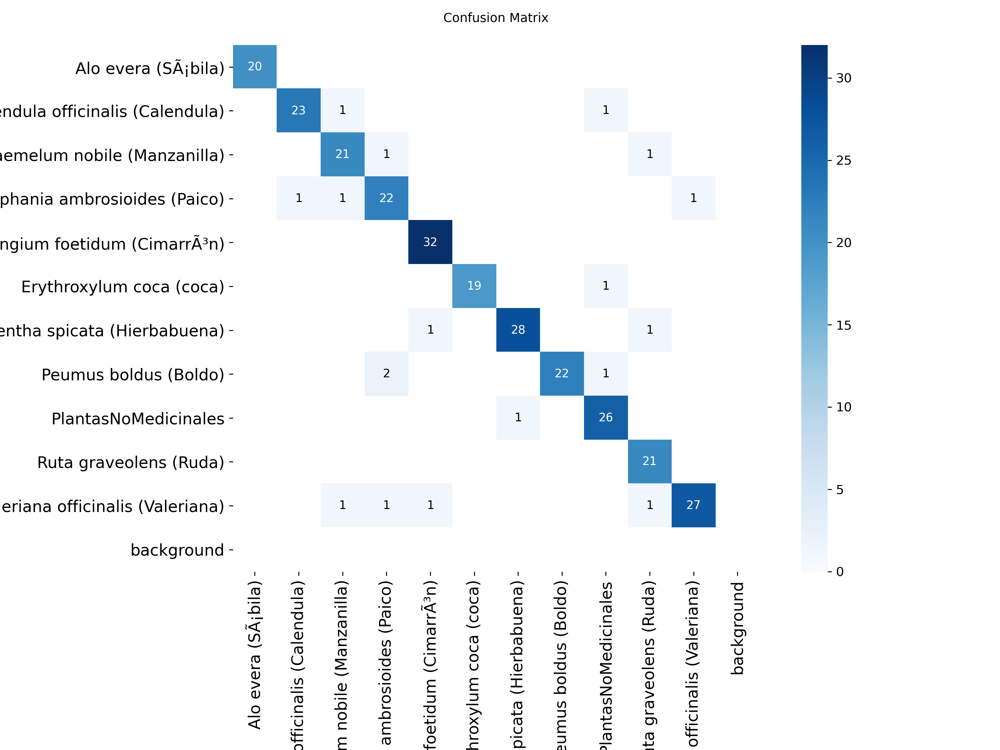

In [8]:
# Matriz de confusión (confusion_matrix.png
display(Image(filename=f"{exp_dir}/confusion_matrix.png"))

Se usa el conjunto de test del dataset para hacer inferencia

YOLOv8s-cls summary (fused): 30 layers, 5,089,291 parameters, 0 gradients, 12.5 GFLOPs


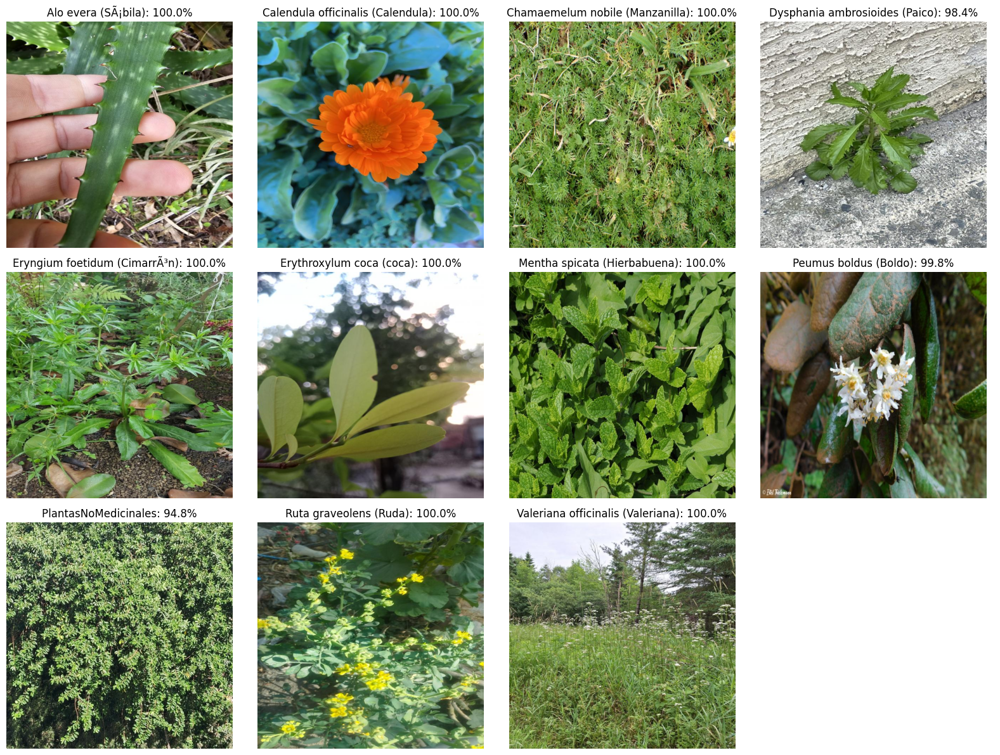


Accuracy total: 91.04%

Reporte de Clasificación:
                                   precision    recall  f1-score   support

              Alo evera (SÃ¡bila)      1.000     1.000     1.000         9
Calendula officinalis (Calendula)      0.750     1.000     0.857         9
  Chamaemelum nobile (Manzanilla)      1.000     1.000     1.000         9
   Dysphania ambrosioides (Paico)      0.818     0.900     0.857        10
    Eryngium foetidum (CimarrÃ³n)      0.846     0.917     0.880        12
         Erythroxylum coca (coca)      0.818     0.900     0.857        10
     Mentha spicata (Hierbabuena)      1.000     0.857     0.923        21
            Peumus boldus (Boldo)      1.000     0.857     0.923        14
             PlantasNoMedicinales      0.857     0.857     0.857        14
           Ruta graveolens (Ruda)      1.000     1.000     1.000         9
Valeriana officinalis (Valeriana)      0.938     0.882     0.909        17

                         accuracy              

In [9]:
# Carga el modelo entrenado
model = YOLO('/content/runs/classify/train/weights/best.pt')
model.fuse()

# Carpeta de test
test_root = '/content/Green_MachineV2-1/test'

# Lista de clases desde el modelo
if isinstance(model.names, dict):
    class_names = [model.names[i] for i in sorted(model.names.keys())]
else:
    class_names = list(model.names)

# Elegir aleatoriamente 1 imagen por clase para el collage
image_paths = []
for cls in class_names:
    cls_dir = os.path.join(test_root, cls)
    imgs = [os.path.join(cls_dir, f) for f in os.listdir(cls_dir) if f.lower().endswith(('.jpg','.jpeg','.png'))]
    if imgs:
        image_paths.append(random.choice(imgs))

n = len(image_paths)
cols = math.ceil(math.sqrt(n))
rows = math.ceil(n / cols)

# Crear el collage
fig, axes = plt.subplots(rows, cols, figsize=(cols*4, rows*4))
axes = axes.flatten()

for ax, img_path in zip(axes, image_paths):
    img = mpimg.imread(img_path)
    ax.imshow(img)
    ax.axis('off')
    results = model.predict(source=img_path, task='classify', imgsz=640, device=0, verbose=False)
    p = results[0].probs
    idx = int(p.top1)
    conf = float(p.top1conf) * 100.0
    label = model.names[idx]
    ax.set_title(f"{label}: {conf:.1f}%", fontsize=12)

for ax in axes[n:]:
    ax.axis('off')

plt.tight_layout()
plt.show()

# =============================
# Evaluación completa del test
# =============================

y_true = []
y_pred = []
class_to_idx = {name: i for i, name in enumerate(class_names)}

for cls_name in class_names:
    cls_dir = os.path.join(test_root, cls_name)
    imgs = [os.path.join(cls_dir, f) for f in os.listdir(cls_dir) if f.lower().endswith(('.jpg','.jpeg','.png'))]
    for img_path in imgs:
        results = model.predict(source=img_path, task='classify', imgsz=640, device=0, verbose=False)
        pred_idx = int(results[0].probs.top1)
        y_true.append(class_to_idx[cls_name])
        y_pred.append(pred_idx)

# Accuracy
acc = accuracy_score(y_true, y_pred)
print(f"\nAccuracy total: {acc*100:.2f}%")

# Classification Report
print("\nReporte de Clasificación:")
print(classification_report(y_true, y_pred, target_names=class_names, digits=3))

YOLOv8s-cls summary (fused): 30 layers, 5,089,291 parameters, 0 gradients, 12.5 GFLOPs


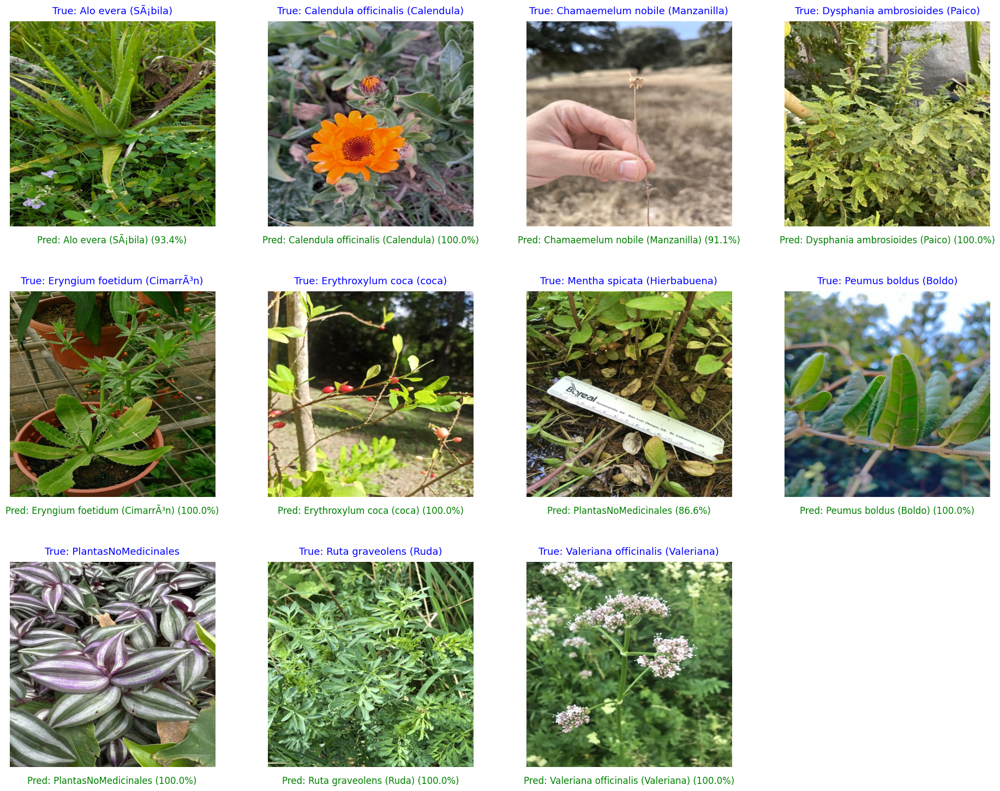


Accuracy total: 91.04%

Reporte de Clasificación:
                                   precision    recall  f1-score   support

              Alo evera (SÃ¡bila)      1.000     1.000     1.000         9
Calendula officinalis (Calendula)      0.750     1.000     0.857         9
  Chamaemelum nobile (Manzanilla)      1.000     1.000     1.000         9
   Dysphania ambrosioides (Paico)      0.818     0.900     0.857        10
    Eryngium foetidum (CimarrÃ³n)      0.846     0.917     0.880        12
         Erythroxylum coca (coca)      0.818     0.900     0.857        10
     Mentha spicata (Hierbabuena)      1.000     0.857     0.923        21
            Peumus boldus (Boldo)      1.000     0.857     0.923        14
             PlantasNoMedicinales      0.857     0.857     0.857        14
           Ruta graveolens (Ruda)      1.000     1.000     1.000         9
Valeriana officinalis (Valeriana)      0.938     0.882     0.909        17

                         accuracy              

In [10]:
# Carga el modelo entrenado
model = YOLO('/content/runs/classify/train/weights/best.pt')
model.fuse()

# Carpeta de test
test_root = '/content/Green_MachineV2-1/test'

# Lista de clases desde el modelo
if isinstance(model.names, dict):
    class_names = [model.names[i] for i in sorted(model.names.keys())]
else:
    class_names = list(model.names)

# Elegir aleatoriamente 1 imagen por clase para el collage
image_paths = []
for cls in class_names:
    cls_dir = os.path.join(test_root, cls)
    imgs = [os.path.join(cls_dir, f) for f in os.listdir(cls_dir) if f.lower().endswith(('.jpg','.jpeg','.png'))]
    if imgs:
        image_paths.append(random.choice(imgs))

n = len(image_paths)
cols = math.ceil(math.sqrt(n))
rows = math.ceil(n / cols)

fig, axes = plt.subplots(rows, cols, figsize=(cols*4 +3, rows*4+3))
axes = axes.flatten()

for ax, img_path in zip(axes, image_paths):

    # Cargar imagen
    img = mpimg.imread(img_path)
    ax.imshow(img)
    ax.axis('off')

    # === Obtener clase verdadera desde la carpeta ===
    true_class = img_path.split("/")[-2]   # nombre de la carpeta

    # === Predicción ===
    results = model.predict(
        source=img_path,
        task='classify',
        imgsz=640,
        device=0,
        verbose=False
    )

    p = results[0].probs
    pred_idx = int(p.top1)
    pred_class = model.names[pred_idx]
    conf = float(p.top1conf) * 100.0

    # ==== TITULO SUPERIOR: clase verdadera ====
    ax.set_title(f"True: {true_class}", fontsize=13, color="blue", pad=10)

    # ==== TEXTO INFERIOR: clase predicha + confianza ====
    ax.text(
        0.5, -0.08,
        f"Pred: {pred_class} ({conf:.1f}%)",
        fontsize=12,
        color="green",
        ha="center",
        transform=ax.transAxes
    )

# Ocultar ejes vacíos
for ax in axes[n:]:
    ax.axis('off')

plt.tight_layout()
plt.show()

# =============================
# Evaluación completa del test
# =============================

y_true = []
y_pred = []
class_to_idx = {name: i for i, name in enumerate(class_names)}

for cls_name in class_names:
    cls_dir = os.path.join(test_root, cls_name)
    imgs = [os.path.join(cls_dir, f) for f in os.listdir(cls_dir) if f.lower().endswith(('.jpg','.jpeg','.png'))]
    for img_path in imgs:
        results = model.predict(source=img_path, task='classify', imgsz=640, device=0, verbose=False)
        pred_idx = int(results[0].probs.top1)
        y_true.append(class_to_idx[cls_name])
        y_pred.append(pred_idx)

# Accuracy
acc = accuracy_score(y_true, y_pred)
print(f"\nAccuracy total: {acc*100:.2f}%")

# Classification Report
print("\nReporte de Clasificación:")
print(classification_report(y_true, y_pred, target_names=class_names, digits=3))

El modelo se exporta a torchscript para luego implementar este en huggingface

In [11]:
"""## Exportación del Modelo a TorchScript

Se exporta el modelo entrenado a formato TorchScript y se implementan funciones para cargar el modelo, preprocesar imágenes y realizar inferencias.
"""

# Exportar el modelo a formato TorchScript
model = YOLO("/content/runs/classify/train/weights/best.pt")
model.export(
    format='torchscript',  # Formato de exportación
    imgsz=640,            # Tamaño de las imágenes
    data="/content/Green_MachineV2-1/data.yaml",        # Ruta al archivo YAML
    half=False
)
print("Modelo exportado a TorchScript.")

Ultralytics 8.3.235 🚀 Python-3.12.12 torch-2.9.0+cu126 CPU (Intel Xeon CPU @ 2.00GHz)
💡 ProTip: Export to OpenVINO format for best performance on Intel hardware. Learn more at https://docs.ultralytics.com/integrations/openvino/
YOLOv8s-cls summary (fused): 30 layers, 5,089,291 parameters, 0 gradients, 12.5 GFLOPs

PyTorch: starting from '/content/runs/classify/train/weights/best.pt' with input shape (1, 3, 640, 640) BCHW and output shape(s) (1, 11) (9.8 MB)

TorchScript: starting export with torch 2.9.0+cu126...
TorchScript: export success ✅ 1.4s, saved as '/content/runs/classify/train/weights/best.torchscript' (19.6 MB)

Export complete (2.0s)
Results saved to /content/runs/classify/train/weights
Predict:         yolo predict task=classify model=/content/runs/classify/train/weights/best.torchscript imgsz=640  
Validate:        yolo val task=classify model=/content/runs/classify/train/weights/best.torchscript imgsz=640 data=/content/Green_MachineV2-1  
Visualize:       https://netron.a

Se hace inferencia con el modelo de torchscript

Loading /content/runs/classify/train/weights/best.torchscript for TorchScript inference...


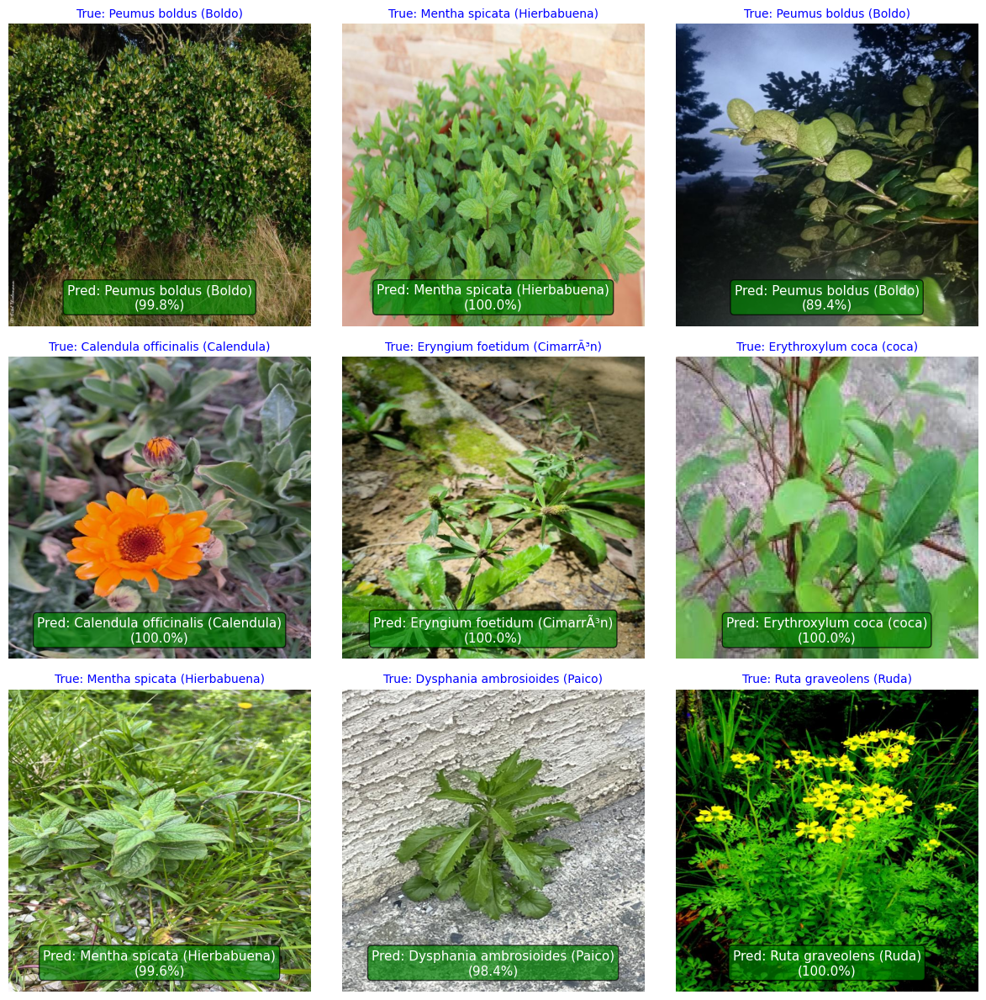

In [13]:
# ==========================================
# CÓDIGO CORREGIDO PARA COLAB
# ==========================================
import os
import random
import math
import matplotlib.pyplot as plt
import matplotlib.image as mpimg
from ultralytics import YOLO
import numpy as np

# 1. Cargar el modelo TorchScript usando Ultralytics (igual que en local)
# Esto asegura que el pre-procesamiento (crop/resize) sea perfecto.
model_path = '/content/runs/classify/train/weights/best.torchscript'
model = YOLO(model_path, task='classify')

# Carpeta de test
test_root = '/content/Green_MachineV2-1/test'

def create_collage_smart(model, test_root, num_images=9):
    # Recolectar imágenes
    all_images = []
    for class_name in sorted(os.listdir(test_root)):
        class_path = os.path.join(test_root, class_name)
        if os.path.isdir(class_path):
            for fname in os.listdir(class_path):
                if fname.lower().endswith(('.jpg', '.jpeg', '.png')):
                    full_path = os.path.join(class_path, fname)
                    all_images.append((full_path, class_name))

    if not all_images:
        print("No se encontraron imágenes.")
        return

    # Seleccionar aleatorias
    num_images = min(num_images, len(all_images))
    selected = random.sample(all_images, num_images)

    # Configurar Grid
    cols = int(math.ceil(math.sqrt(num_images)))
    rows = int(math.ceil(num_images / cols))

    plt.figure(figsize=(cols*4, rows*4))

    for i, (img_path, true_class) in enumerate(selected):
        # --- LA MAGIA ESTÁ AQUÍ ---
        # Dejamos que Ultralytics haga la predicción
        results = model(img_path, verbose=False)
        r = results[0]

        top1_idx = r.probs.top1
        conf = r.probs.top1conf.item() * 100
        pred_label = r.names[top1_idx]

        # Graficar
        ax = plt.subplot(rows, cols, i + 1)
        img = mpimg.imread(img_path)
        ax.imshow(img)
        ax.axis('off')

        # Título Real
        ax.set_title(f"True: {true_class}", fontsize=10, color='blue')

        # Etiqueta Predicha
        # Si acierta, verde; si falla, rojo
        color_texto = 'green' if true_class == pred_label else 'red'

        txt = f"Pred: {pred_label}\n({conf:.1f}%)"
        ax.text(
            0.5, 0.05, txt,
            fontsize=11, color='white',
            ha='center', va='bottom', transform=ax.transAxes,
            bbox=dict(facecolor=color_texto, alpha=0.7, boxstyle='round,pad=0.3')
        )

    plt.tight_layout()
    plt.show()

# Ejecutar
create_collage_smart(model, test_root, num_images=9)